In [13]:
import streamlit as st
import pandas as pd
import numpy as np
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from datetime import datetime as dt
from keplergl import KeplerGl
from streamlit_keplergl import keplergl_static

In [15]:
dtype_mapping = {6: str, 8: str} # force columns as string data types
df = pd.read_csv('Data_Small_Sample.csv', dtype=dtype_mapping)

In [17]:
df.shape

(1491940, 16)

In [19]:
df.drop(columns=['Unnamed: 0'], inplace=True)

In [21]:
# create month column 
df['date'] = pd.to_datetime(df['date'], format = '%Y-%m-%d')
df['month'] = df['date'].dt.month
df['month'] = df['month'].astype('int')

In [23]:
# create season column
df['season'] = [
"winter" if (month == 12 or 1 <= month <= 4)
    else "spring" if (4 < month <= 5)
    else "summer" if (6 <= month <= 9)
    else "fall"
for month in df['month']
    ]

In [25]:
# add new column of total trip counts by date
df['trip_count'] = df.groupby('date')['ride_id'].transform('count')

In [27]:
df.columns

Index(['ride_id', 'rideable_type', 'started_at', 'ended_at',
       'start_station_name', 'start_station_id', 'end_station_name',
       'end_station_id', 'start_lat', 'start_lng', 'end_lat', 'end_lng',
       'member_casual', 'date', 'avgTemp', 'month', 'season', 'trip_count'],
      dtype='object')

In [29]:
# create sample dataframe from the sample so computer can process it for line chart
df_sample = df.sample(frac=0.05, random_state=42).reset_index(drop=True)

In [31]:
df_sample['date'] = pd.to_datetime(df_sample['date'])
df_sample = df_sample.sort_values('date')

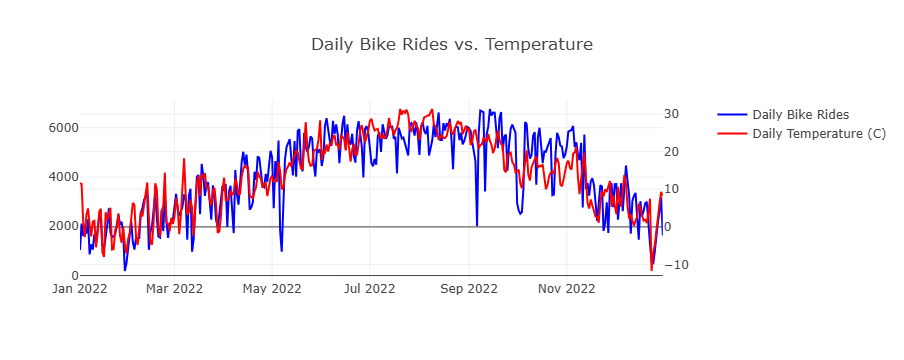

In [39]:
fig = make_subplots(specs=[[{"secondary_y": True}]])

fig.add_trace(
    go.Scatter(
        x=df_sample['date'],
        y=df_sample['trip_count'],
        name='Daily Bike Rides',
        line=dict(color='blue')
    ),
    secondary_y=False
)

fig.add_trace(
    go.Scatter(
        x=df_sample['date'],
        y=df_sample['avgTemp'],
        name='Daily Temperature (C)',
        line=dict(color='red')
    ),
    secondary_y=True
)

fig.update_layout(
    title_text='Daily Bike Rides vs. Temperature',
    title_x=0.5  # centers the title
)

fig.show()

In [45]:
# create groups and top 20 dataframe
df_sample['value'] = 1 
df_groupby_bar = df_sample.groupby('start_station_name', as_index=False).agg({'value': 'sum'})
top20 = df_groupby_bar.nlargest(20, 'value')

In [49]:
df_sample.to_csv('Data_Smallest_Sample.csv')

In [51]:
top20.to_csv('Top_20.csv')